<a href="https://colab.research.google.com/github/DiNOV-Tokyo/yolov5/blob/main/yolov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. 例を使ってそのまま学習

**参考にしたサイト**
https://www.koi.mashykom.com/pytorch_3.html

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/My\ Drive/Colab\ Notebooks
# %mkdir yolo
%cd yolo

/content/drive/My Drive/Colab Notebooks
/content/drive/My Drive/Colab Notebooks/yolo


In [ ]:
!pwd


/content/drive/My Drive/Colab Notebooks/yolo


In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo

Cloning into 'yolov5'...
remote: Enumerating objects: 7012, done.
remote: Counting objects: 100% (118/118), done.
remote: Compressing objects: 100% (101/101), done.
remote: Total 7012 (delta 61), reused 39 (delta 17), pack-reused 6894
Receiving objects: 100% (7012/7012), 9.37 MiB | 11.36 MiB/s, done.
Resolving deltas: 100% (4800/4800), done.


In [ ]:
!pip install -r yolov5/requirements.txt  # install dependencies

     |████████████████████████████████| 645kB 8.4MB/s 
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [3]:
%cd yolov5

/content/drive/My Drive/Colab Notebooks/yolo/yolov5


In [4]:
import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets
 
clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))
 

Setup complete. Using torch 1.8.1+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=416, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='./data/images/', update=False, view_img=False, weights=['yolov5s.pt'])
requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13

requirements: 1 package updated per /content/drive/My Drive/Colab Notebooks/yolo/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

YOLOv5 🚀 2021-6-9 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 224 layers, 7266973 parameters, 0 gradients
image 1/2 /content/drive/MyDrive/Colab Notebooks/yolo/yolov5/data/images/bu

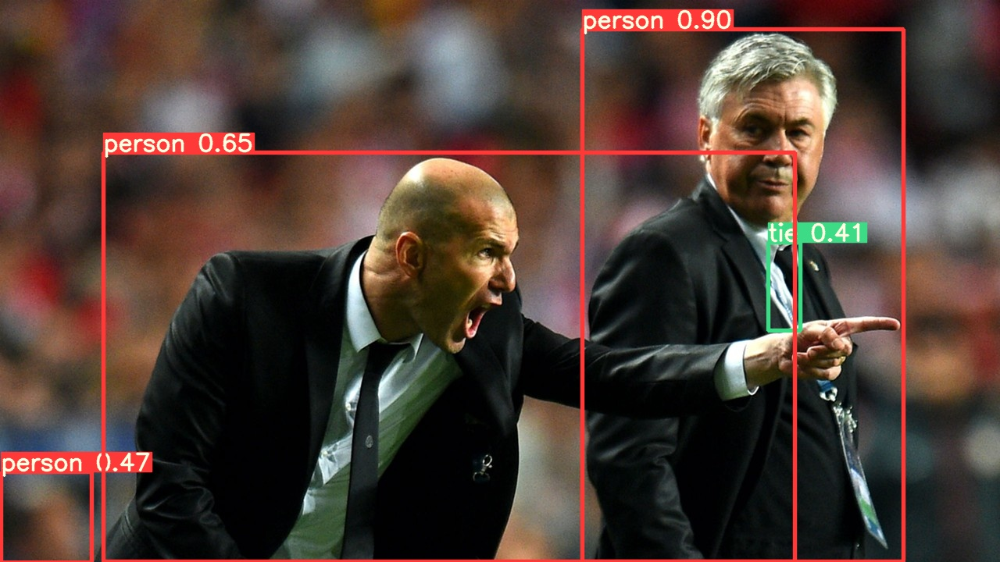

In [ ]:
!python detect.py --weights yolov5s.pt --img 416 --conf 0.4 --source ./data/images/
Image(filename='runs/detect/exp/zidane.jpg', width=600)

In [ ]:
# Download COCO128
torch.hub.download_url_to_file('https://github.com/ultralytics/yolov5/releases/download/v1.0/coco128.zip', 'tmp.zip')
!unzip -q tmp.zip -d ../ && rm tmp.zip

In [ ]:
 # Start tensorboard
%load_ext tensorboard
%tensorboard --logdir "runs"

<IPython.core.display.Javascript object>

## 学習してみる

In [ ]:
# Train YOLOv5s on coco128 for 5 epochs
!python train.py --img 640 --batch 16 --epochs 5 --data ./data/coco128.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name tutorial --nosave --cache

github: Command 'git fetch && git config --get remote.origin.url' timed out after 5 seconds, for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2021-6-9 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=True, cfg='./models/yolov5s.yaml', data='./data/coco128.yaml', device='', entity=None, epochs=5, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='tutorial', noautoanchor=False, nosave=True, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/tutorial', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, weights='yolov5s.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
2021-06-10 

In [ ]:
!ls runs/train/tutorial/

confusion_matrix.png				   results.txt
events.out.tfevents.1623236937.2f36177f6364.204.0  test_batch0_labels.jpg
F1_curve.png					   test_batch0_pred.jpg
hyp.yaml					   test_batch1_labels.jpg
labels_correlogram.jpg				   test_batch1_pred.jpg
labels.jpg					   test_batch2_labels.jpg
opt.yaml					   test_batch2_pred.jpg
P_curve.png					   train_batch0.jpg
PR_curve.png					   train_batch1.jpg
R_curve.png					   train_batch2.jpg
results.png					   weights


学習結果のイメージ画像

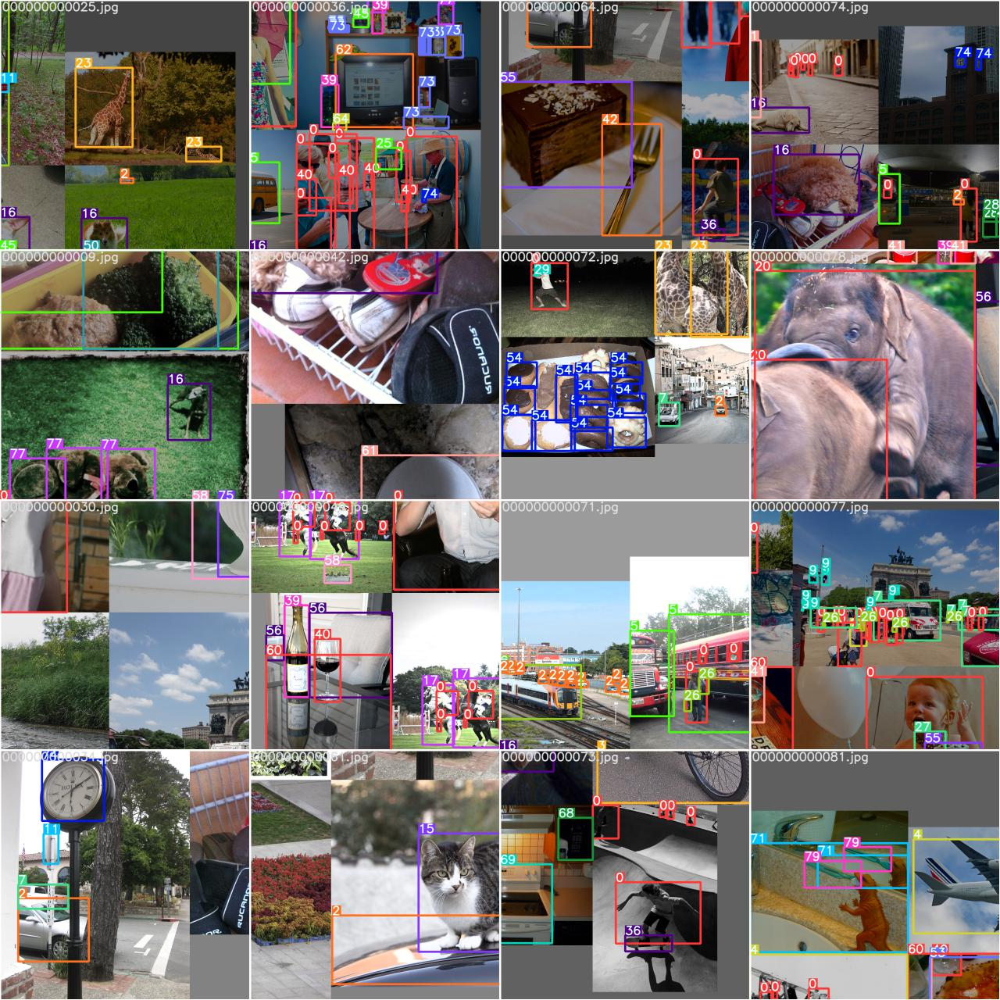

In [ ]:
Image(filename='runs/train/tutorial/train_batch0.jpg', width=800)  # train batch 0 mosaics and labels

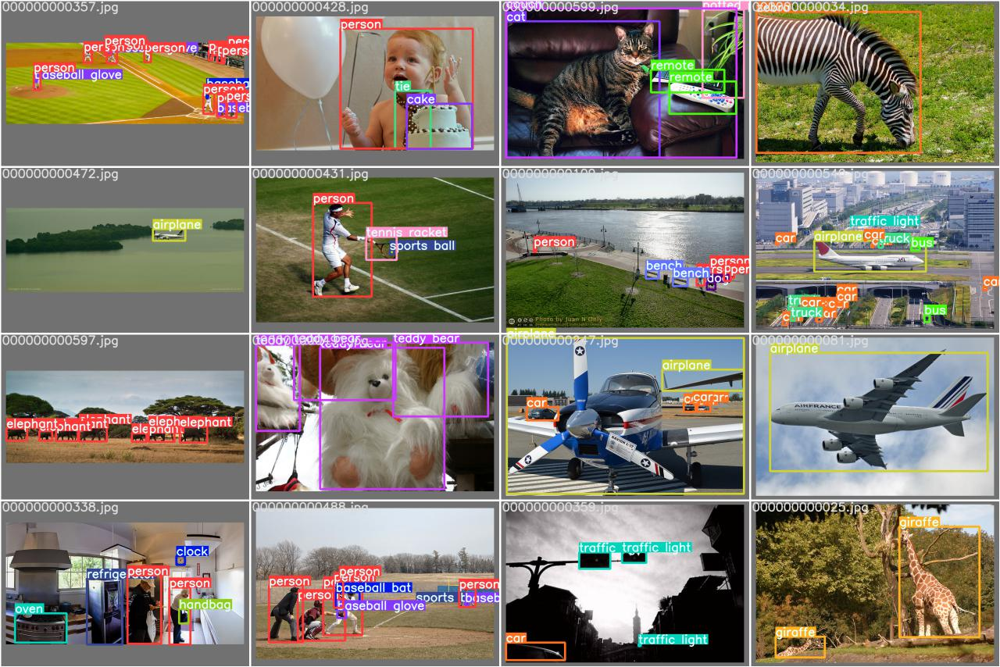

In [ ]:
Image(filename='runs/train/tutorial/test_batch0_labels.jpg', width=800)  # test batch 0 labels

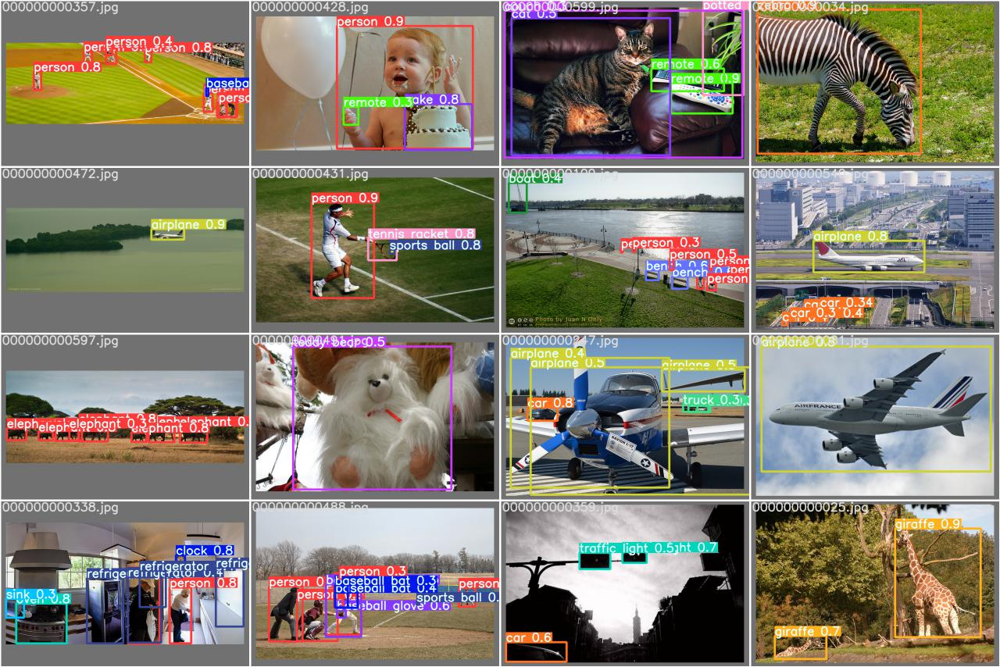

In [ ]:
Image(filename='runs/train/tutorial/test_batch0_pred.jpg', width=800)  # test batch 0 predictions

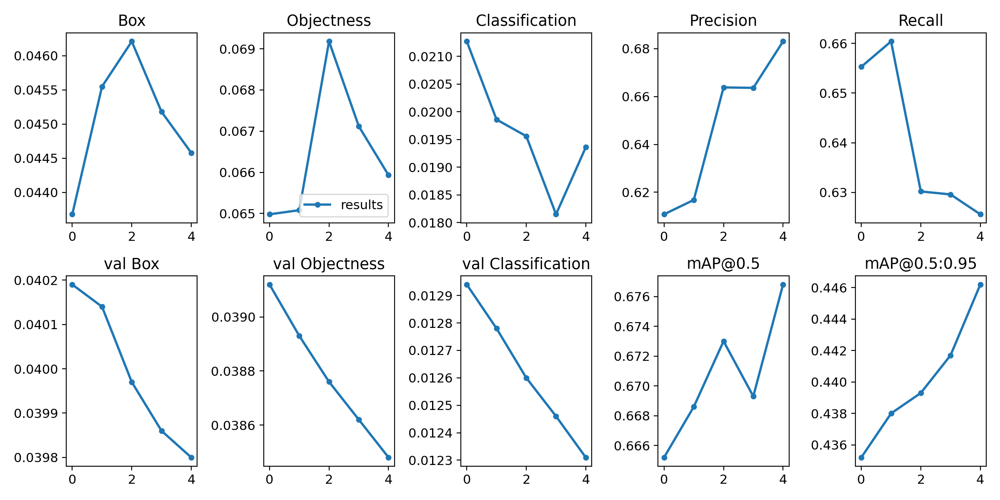

In [ ]:
from utils.pt(save_dir='runs/train/tutorial')  # plot all results*.txt as results.png
Image(filename='runs/train/tutorial/results.png', width=800)

In [ ]:
!ls ../coco128/images/train2017

000000000009.jpg  000000000154.jpg  000000000370.jpg  000000000529.jpg
000000000025.jpg  000000000164.jpg  000000000382.jpg  000000000531.jpg
000000000030.jpg  000000000165.jpg  000000000384.jpg  000000000532.jpg
000000000034.jpg  000000000192.jpg  000000000387.jpg  000000000536.jpg
000000000036.jpg  000000000194.jpg  000000000389.jpg  000000000540.jpg
000000000042.jpg  000000000196.jpg  000000000394.jpg  000000000542.jpg
000000000049.jpg  000000000201.jpg  000000000395.jpg  000000000544.jpg
000000000061.jpg  000000000208.jpg  000000000397.jpg  000000000560.jpg
000000000064.jpg  000000000241.jpg  000000000400.jpg  000000000562.jpg
000000000071.jpg  000000000247.jpg  000000000404.jpg  000000000564.jpg
000000000072.jpg  000000000250.jpg  000000000415.jpg  000000000569.jpg
000000000073.jpg  000000000257.jpg  000000000419.jpg  000000000572.jpg
000000000074.jpg  000000000260.jpg  000000000428.jpg  000000000575.jpg
000000000077.jpg  000000000263.jpg  000000000431.jpg  000000000581.jpg
000000

物体検出してみる。

In [ ]:
!python detect.py --weights runs/train/tutorial/weights/best.pt --img 416 --conf 0.4 --source ../coco128/images/train2017/*360.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=416, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='../coco128/images/train2017/000000000360.jpg', update=False, view_img=False, weights=['runs/train/tutorial/weights/best.pt'])
YOLOv5 🚀 v5.0-164-g0cfc5b2 torch 1.8.1+cu101 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 224 layers, 7266973 parameters, 0 gradients, 17.0 GFLOPs
image 1/1 /content/yolov5/../coco128/images/train2017/000000000360.jpg: 320x416 1 person, Done. (0.023s)
Results saved to runs/detect/exp2
Done. (0.036s)


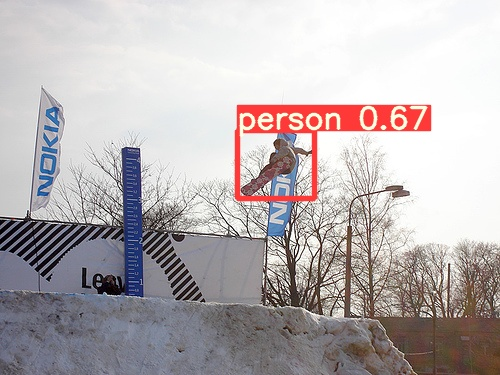

In [ ]:
Image(filename='runs/detect/exp2/000000000360.jpg', width=600)

# 2. Dataset を取得して学習してみる

**参考にしたサイト**
https://www.koi.mashykom.com/pytorch_3.html

## 2.1 US Sign Dataset


Roboflowから”American Sign Language Letters Dataset”を取得
./data の US_SignUS フォルダへコピー


In [7]:
#!pwd
!python train.py --img 416 --batch 16 --epochs 10 --data ./data/US_Sign/data.yaml --cfg ./models/yolov5m.yaml --weights yolov5m.pt --nosave --cache --name test_yolov5m

github: ⚠️ WARNING: code is out of date by 12 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 🚀 2021-6-9 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=True, cfg='./models/yolov5m.yaml', data='./data/US_Sign/data.yaml', device='', entity=None, epochs=10, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='test_yolov5m', noautoanchor=False, nosave=True, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/test_yolov5m5', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, weights='yolov5m.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localh

In [8]:
!python detect.py --weights runs/train/test_yolov5m5/weights/last.pt --img 416 --conf 0.4 --source ./data/US_Sign/test/images/test2.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=416, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='./data/US_Sign/test/images/test2.jpg', update=False, view_img=False, weights=['runs/train/test_yolov5m5/weights/last.pt'])
YOLOv5 🚀 2021-6-9 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 308 layers, 21138663 parameters, 0 gradients
image 1/1 /content/drive/My Drive/Colab Notebooks/yolo/yolov5/data/US_Sign/test/images/test2.jpg: 416x416 Done. (0.020s)
Results saved to runs/detect/exp16
Done. (0.039s)


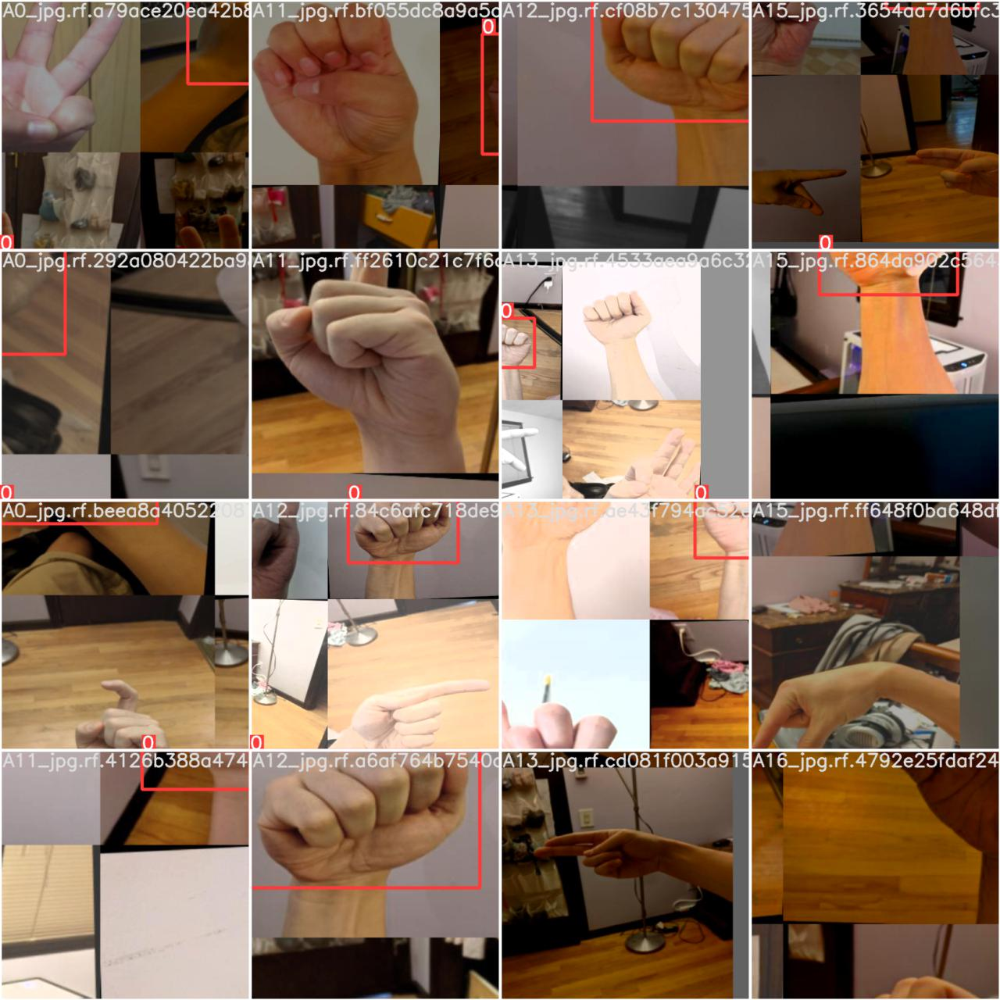

In [10]:
Image(filename='runs/train/test_yolov5m5/train_batch0.jpg', width=800)  # train batch 0 mosaics and labels

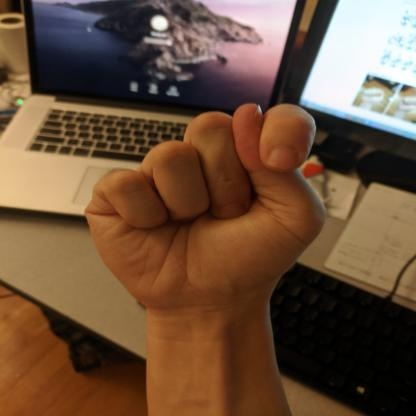

In [9]:
Image(filename='runs/detect/exp16/test2.jpg', width=600)

In [ ]:
#!pwd
!python train.py --img 416 --batch 16 --epochs 10 --data ./data/US_Sign/data.yaml --cfg ./models/yolov5m.yaml  --nosave --cache --name test_yolov5m

github: ⚠️ WARNING: code is out of date by 9 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 🚀 2021-6-9 torch 1.8.1+cu101 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=True, cfg='./models/yolov5m.yaml', data='./data/US_Sign/data.yaml', device='', entity=None, epochs=10, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='test_yolov5m', noautoanchor=False, nosave=True, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/test_yolov5m', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, weights='yolov5s.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://local

In [ ]:
!python detect.py --weights runs/train/test_yolov5s4/weights/last.pt --img 416 --conf 0.4 --source ./data/US_Sign/test/images/test2.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=416, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='./data/US_Sign/test/images/test2.jpg', update=False, view_img=False, weights=['runs/train/test_yolov5s4/weights/last.pt'])
YOLOv5 🚀 2021-6-9 torch 1.8.1+cu101 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 224 layers, 7121335 parameters, 0 gradients
image 1/1 /content/drive/My Drive/Colab Notebooks/yolo/yolov5/data/US_Sign/test/images/test2.jpg: 416x416 Done. (0.009s)
Results saved to runs/detect/exp6
Done. (0.277s)


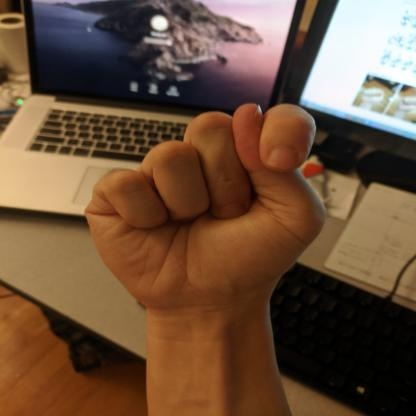

In [ ]:
Image(filename='runs/detect/exp6/test2.jpg', width=600)

## 2.2 Mask dataset


RoboflowよりMask Wearing Datasetを取得。
[こちら](https://konchangakita.hatenablog.com/entry/2020/08/17/220000)を参照。

In [ ]:
#!pwd
!python train.py --img 416 --batch 16 --epochs 10 --data ./data/mask/data.yaml --cfg ./models/yolov5x.yaml --weights yolov5x.pt --nosave --cache --name test_yolov5x

github: ⚠️ WARNING: code is out of date by 9 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 🚀 2021-6-9 torch 1.8.1+cu101 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=True, cfg='./models/yolov5x.yaml', data='./data/mask/data.yaml', device='', entity=None, epochs=10, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='test_yolov5x', noautoanchor=False, nosave=True, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/test_yolov5x', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, weights='yolov5x.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhos

In [ ]:
!python detect.py --weights runs/train/test_yolov5x/weights/best.pt --img 416 --conf 0.4 --source ./data/mask/test/images/test3.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=416, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='./data/mask/test/images/test3.jpg', update=False, view_img=False, weights=['runs/train/test_yolov5x/weights/best.pt'])
YOLOv5 🚀 2021-6-9 torch 1.8.1+cu101 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 476 layers, 87205423 parameters, 0 gradients
image 1/1 /content/drive/My Drive/Colab Notebooks/yolo/yolov5/data/mask/test/images/test3.jpg: 416x416 Done. (0.157s)
Results saved to runs/detect/exp15
Done. (0.175s)


In [ ]:
!python detect.py --source ./data/mask/test/images/test3.jpg

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, half=False, hide_conf=False, hide_labels=False, img_size=640, iou_thres=0.45, line_thickness=3, max_det=1000, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='./data/mask/test/images/test3.jpg', update=False, view_img=False, weights='yolov5s.pt')
YOLOv5 🚀 2021-6-9 torch 1.8.1+cu101 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
Model Summary: 224 layers, 7266973 parameters, 0 gradients
image 1/1 /content/drive/My Drive/Colab Notebooks/yolo/yolov5/data/mask/test/images/test3.jpg: 640x640 10 persons, 1 tie, 1 cup, 1 cell phone, Done. (0.038s)
Results saved to runs/detect/exp14
Done. (0.065s)


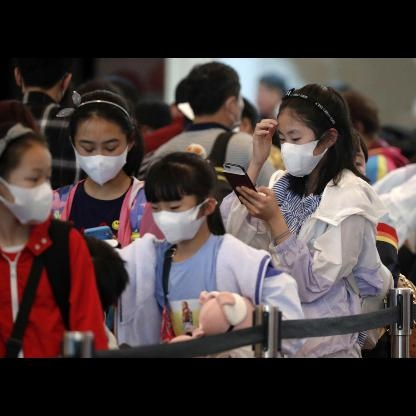

In [ ]:
#!pwd
Image(filename='runs/detect/exp15/test3.jpg', width=600)

# 新しいセクション